In [ ]:
import random
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import load_img, img_to_array
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
df = pd.read_csv('images_clf.csv')
df.head()

,images,label
0,PetImages\Dog\331.jpg,1
1,PetImages\Dog\8299.jpg,1
2,PetImages\Dog\11996.jpg,1
3,PetImages\Cat\1390.jpg,0
4,PetImages\Dog\7090.jpg,1


In [ ]:
dog_mislabeled_as_cat = df[df['images'].str.contains('Dog') & (df['label'] == 0)]
cat_mislabeled_as_dog = df[df['images'].str.contains('Cat') & (df['label'] == 1)]

print("🚫 Dog images labeled as Cat (label = 0):", len(dog_mislabeled_as_cat))
print(dog_mislabeled_as_cat.head())

print("\n🚫 Cat images labeled as Dog (label = 1):", len(cat_mislabeled_as_dog))
print(cat_mislabeled_as_dog.head())

🚫 Dog images labeled as Cat (label = 0): 0
Empty DataFrame
Columns: [images, label]
Index: []

🚫 Cat images labeled as Dog (label = 1): 0
Empty DataFrame
Columns: [images, label]
Index: []


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24998 entries, 0 to 24997
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   images  24998 non-null  object
 1   label   24998 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 390.7+ KB


In [4]:
def display_images(type):
    if type == 'Dogs':
        label = 1
    elif type == 'Cats':
        label = 0
    else: 
        raise ValueError("Invalid type. Please choose either 'Dogs' or 'Cats'.")
    
    plt.figure(figsize=(25, 25))
    plt.title(f'Images of {type}')
    plt.axis('off')
    temp = df[df['label'] == label]['images']
    start = random.randint(0, len(temp))
    files = temp[start : start + 25]

    for index, file in enumerate(files):
        plt.subplot(5, 5, index + 1)
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

    plt.show()

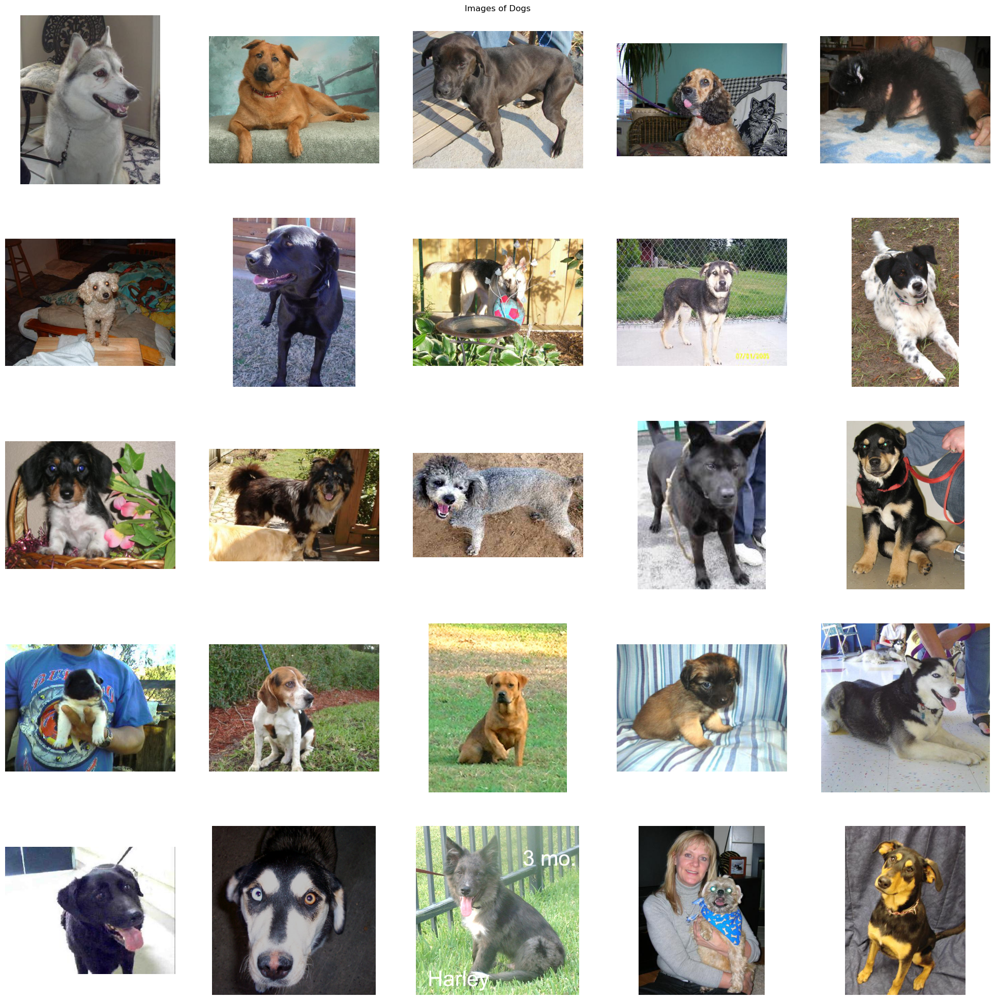

In [5]:
display_images('Dogs')

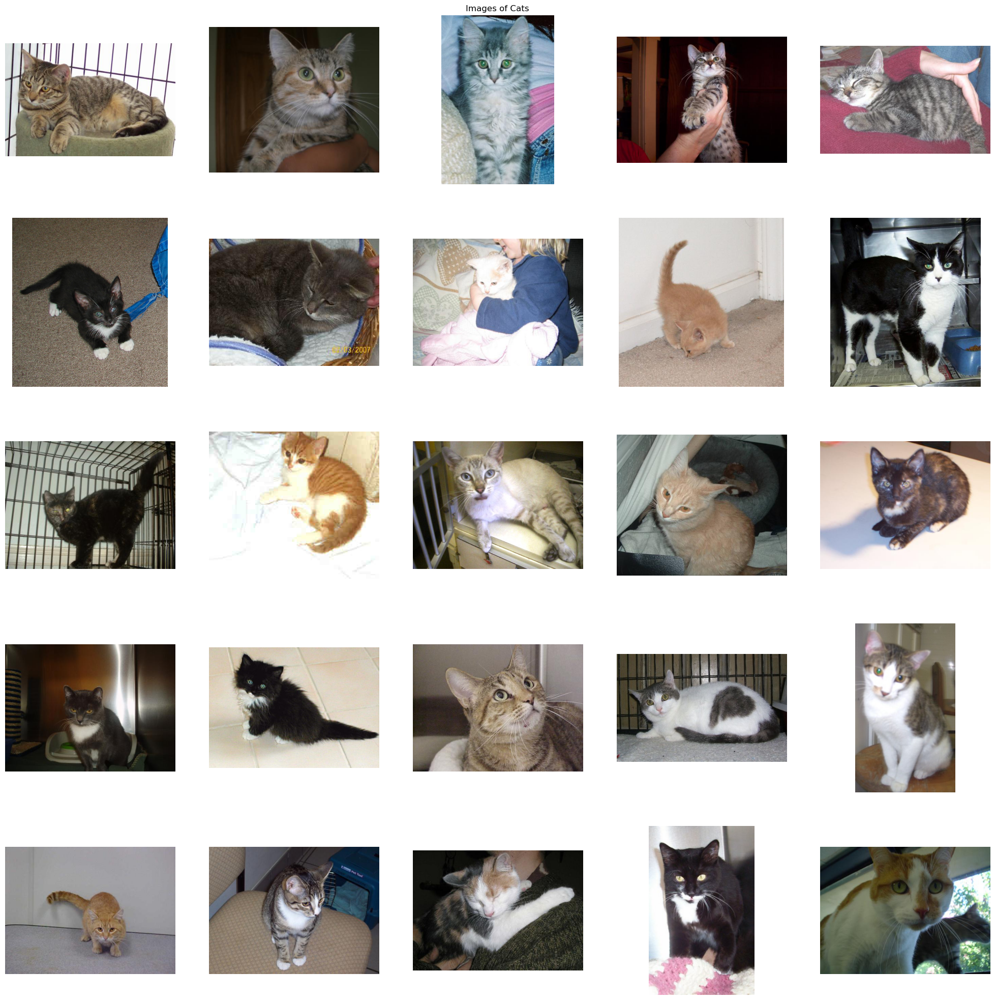

In [6]:
display_images('Cats')

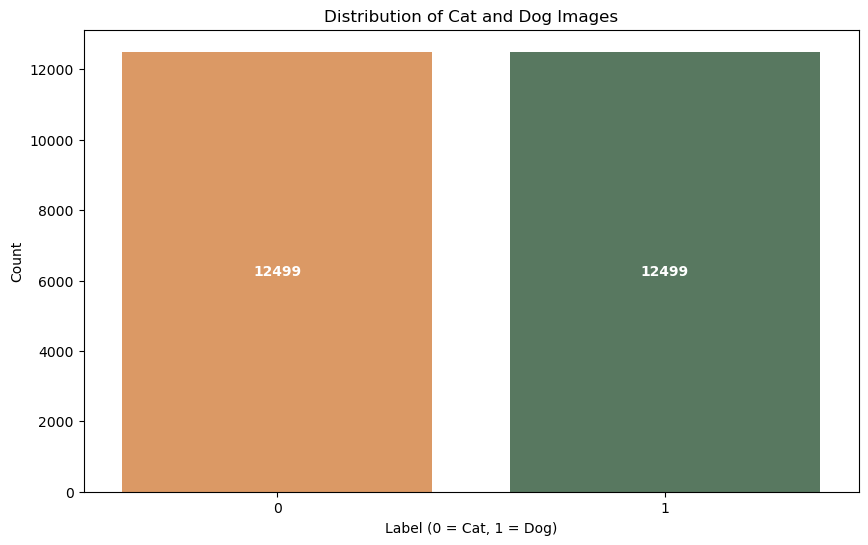

In [7]:
scheme = {'1': '#537D5D', '0': '#EF9651'}

plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='label', palette=scheme)
for p in ax.patches:
    count = int(p.get_height())
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() / 2
    ax.text(
        x, y, count, 
        ha='center', va='center', 
        color='white', fontweight='bold')
plt.xlabel('Label (0 = Cat, 1 = Dog)')
plt.ylabel('Count')
plt.title('Distribution of Cat and Dog Images')
plt.show()

In [8]:
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,PetImages\Dog\331.jpg,1
1,PetImages\Dog\8299.jpg,1
2,PetImages\Dog\11996.jpg,1
3,PetImages\Cat\1390.jpg,0
4,PetImages\Dog\7090.jpg,1


In [ ]:
train, test = train_test_split(
    df, 
    test_size=0.2, 
    random_state=42)

In [10]:
train_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')
val_generator = ImageDataGenerator(rescale=1./255)

In [11]:
train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128, 128),
    batch_size=512,
    class_mode='binary')
val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128, 128),
    batch_size=512,
    class_mode='binary')

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [12]:
model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPool2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPool2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid')])

In [13]:
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
history = model.fit(
    train_iterator, 
    epochs=10, 
    validation_data=val_iterator)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 154s 4s/step - accuracy: 0.5169 - loss: 0.7932 - val_accuracy: 0.6258 - val_loss: 0.6503
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 144s 4s/step - accuracy: 0.6365 - loss: 0.6416 - val_accuracy: 0.6992 - val_loss: 0.5819
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 144s 4s/step - accuracy: 0.6812 - loss: 0.5988 - val_accuracy: 0.7198 - val_loss: 0.5538
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 160s 4s/step - accuracy: 0.7086 - loss: 0.5608 - val_accuracy: 0.7444 - val_loss: 0.5219
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 146s 4s/step - accuracy: 0.7239 - loss: 0.5388 - val_accuracy: 0.7560 - val_loss: 0.5075
Epoch 6/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 159s 4s/step - accuracy: 0.7416 - loss: 0.5155 - val_accuracy: 0.7432 - val_loss: 0.5086
Epoch 7/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 137s 3s/step - accuracy: 0.7476 - loss: 0.5125 - val_accuracy: 0.7714 - val_loss: 0.4784
Epoch 8/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 142s 4s/step - accuracy: 0.7663 - loss: 0.4915 - val_accuracy: 0.7898 - v

In [42]:
acc = history.history['accuracy']
loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
epochs = range(len(acc))

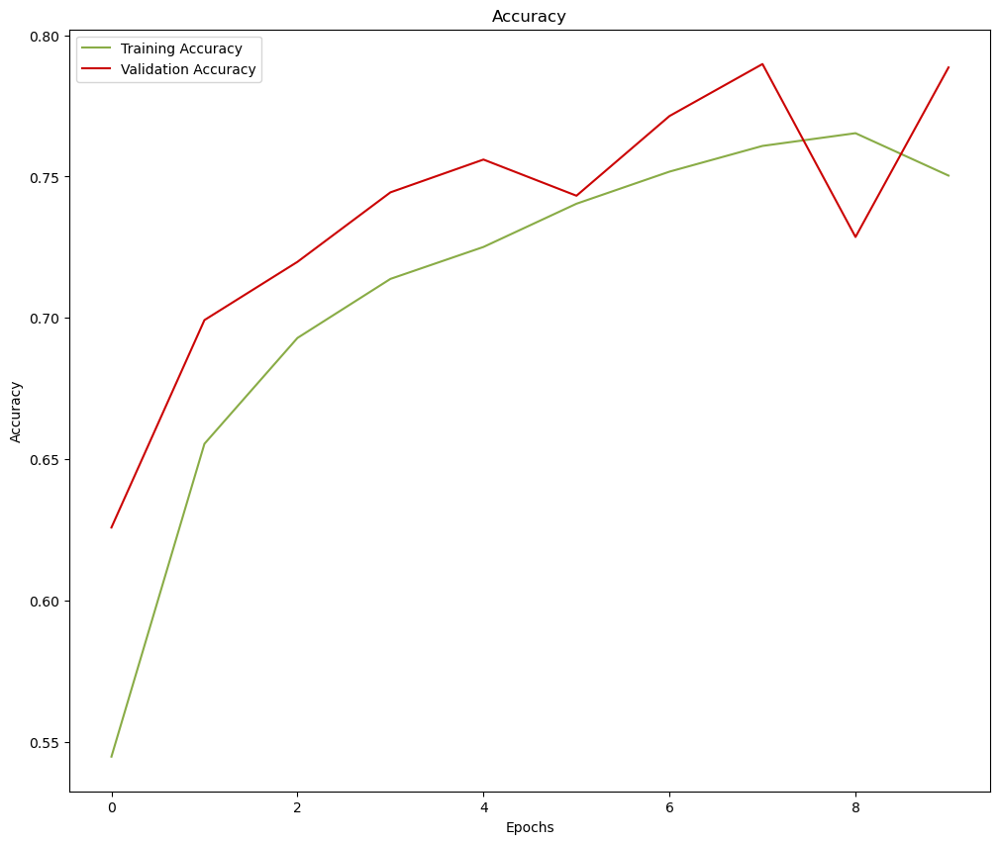

In [43]:
plt.figure(figsize=(12, 10))
plt.plot(epochs, acc, '#89AC46', label='Training Accuracy')
plt.plot(epochs, val_acc, '#CB0404', label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

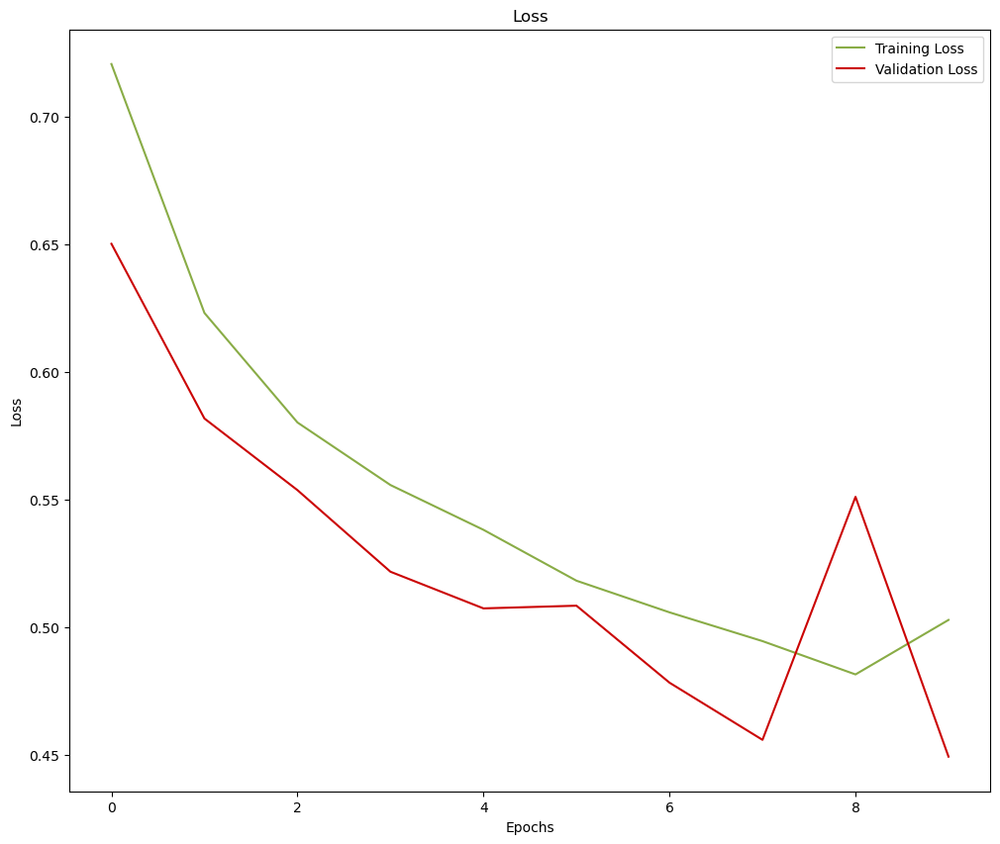

In [44]:
plt.figure(figsize=(12, 10))
plt.plot(epochs, loss, '#89AC46', label='Training Loss')
plt.plot(epochs, val_loss, '#CB0404', label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

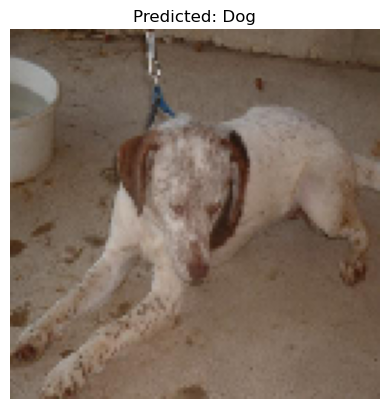

Image: PetImages\Dog\5760.jpg
Predicted Label: Dog



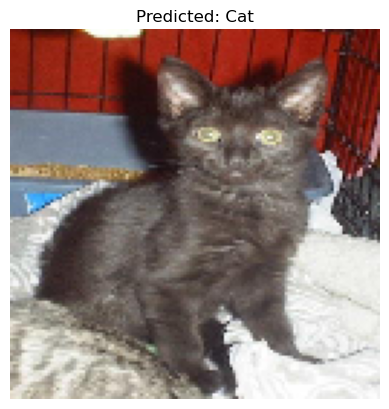

Image: PetImages\Cat\180.jpg
Predicted Label: Cat



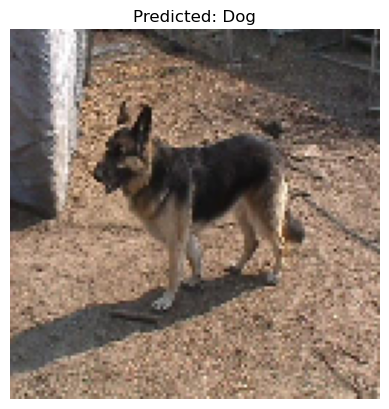

Image: PetImages\Dog\8893.jpg
Predicted Label: Dog



In [53]:
sample_rows = df.sample(n=3).reset_index(drop=True)

for i in range(3):
    image_path = sample_rows.loc[i, 'images']
    label_value = sample_rows.loc[i, 'label']

    img = load_img(image_path, target_size=(128, 128))
    img_array = img_to_array(img) / 255.0
    img_array = img_array.reshape(1, 128, 128, 3)

    pred = model.predict(img_array, verbose=0)
    predicted_label = 'Dog' if pred[0][0] > 0.5 else 'Cat'

    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_label}")
    plt.show()

    print(f"Image: {image_path}")
    print(f"Predicted Label: {predicted_label}\n")
